# Load Model and Data

In [1]:
import sys
sys.path.append("/home/mim-server/projects/robometer/scripts")
from robometer_reward import RobometerReward
rm = RobometerReward("http://localhost:8000")

In [1]:
%load_ext autoreload
%autoreload 2
import torch 
from dreamerv4uwm.datasets import ShardedHDF5Dataset
from dreamerv4uwm.models.utils import load_tokenizer
from dreamerv4uwm.models.utils import load_denoiser
# DATA_PATH = "/home/mim-server/datasets/soar_data_sharded"
# DATA_PATH = "/home/mim-server/datasets/Finger/H5/combined"
DATA_PATH = "/scratch/rk4342/datasets/pushT/demo"
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
resolution = (256, 256)

In [ ]:
from hydra import initialize, compose
from omegaconf import OmegaConf
with initialize(version_base=None, config_path="../scripts/config"):
    cfg = compose(config_name="dynamics/g1-large.yaml")

/home/mim-server/miniconda3/envs/dreamerv4/lib/python3.11/site-packages/hydra/_internal/defaults_list.py:251: UserWarning: In 'dynamics/g1-large.yaml': Defaults list is missing `_self_`. See https://hydra.cc/docs/1.2/upgrades/1.0_to_1.1/default_composition_order for more information
  warnings.warn(msg, UserWarning)


In [3]:
dynamics_ckpt = "/home/mim-server/projects/rooholla/dreamerV4-UWM/checkpoints/dynamics/G1/86504.pt"
tokenizer_ckpt="/home/mim-server/projects/rooholla/dreamerV4-UWM/checkpoints/tokenizer/g1_reference.pt"
cfg.dynamics_ckpt = dynamics_ckpt
cfg.tokenizer_ckpt=tokenizer_ckpt
denoiser = load_denoiser(cfg, device, max_num_forward_steps=300)
tokenizer = load_tokenizer(cfg, device, max_num_forward_steps=300)
tokenizer = tokenizer.eval().cuda()
denoiser = denoiser.eval().cuda()

In [4]:
import mediapy
import matplotlib.pyplot as plt
import numpy as np
from dreamerv4uwm.datasets import G1ChunkDataset
from torch.nn.functional import interpolate

G1_DATA_PATH = "/home/mim-server/robot/GR00T-WholeBodyControl/creo-g1-teleop/new_wm_h5_segmented_small/world_model"
dataset = G1ChunkDataset(
    data_dir=G1_DATA_PATH,
    window_size=128,
    stride=128,
    split="train",
    train_fraction=0.9,
    split_seed=123,
)

# Arbitrary index into that episode
batch = dataset[torch.randint(len(dataset), (1,)).item()]
# imgs = batch["image"][:,[2, 1, 0], :, :]  # (T, C, H, W)
imgs = batch["image"]  # (T, C, H, W)
actions = batch["action"][:,:cfg.denoiser.n_actions]  # (1, T, N_lat, D_lat)
# actions=torch.zeros_like(actions)
imgs = interpolate(imgs, resolution).to(device=device)[None] # resize to tokenizer resolution

with torch.no_grad():
    with torch.autocast(device_type='cuda', dtype=torch.bfloat16):
        latents = tokenizer.encode(imgs)
        imgs_recon = tokenizer.decode(latents)

from mediapy import show_video
def plotVideo(video):
    imgs = video.cpu().permute(0,2,3,1).to(torch.float32).numpy()*255
    imgs = imgs.astype('uint8')
    mediapy.show_video(imgs, fps=10)

plotVideo(imgs_recon[0])
plotVideo(imgs[0])

G1[train]: 4117 windows from 276 episodes (of 307 total) across 228 chunks


/home/mim-server/miniconda3/envs/dreamerv4/lib/python3.11/site-packages/torch/nn/functional.py:2920: UserWarning: Mismatch dtype between input and weight: input dtype = c10::BFloat16, weight dtype = float, Cannot dispatch to fused implementation. (Triggered internally at /pytorch/aten/src/ATen/native/layer_norm.cpp:344.)
  return torch.rms_norm(input, normalized_shape, weight, eps)


In [7]:
# out = rm.predict(imgs, ["pick up the gray bag using its handle and hold it in fron of yourself"])
out = rm.predict(imgs[:,:], ["Pick up the gray bag using its handle and hold it up in front of you and at the center of your field of view."])
out.progress       # torch.Tensor (B, T')
out.success_probs  # torch.Tensor (B, T') — empty (B, 0)

NameError: name 'rm' is not defined

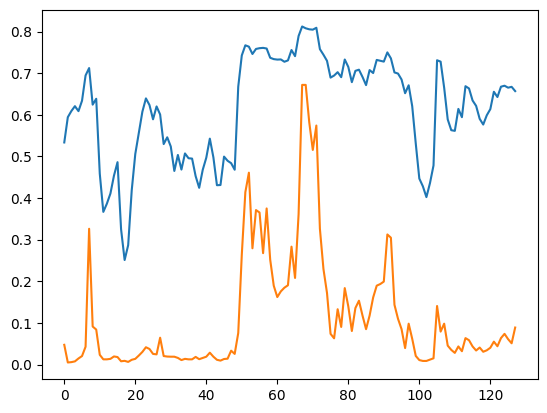

In [31]:
plt.plot(out.progress[0].cpu())
plt.plot(out.success_probs[0].cpu())

# Unified Sampler — All 5 UWM Modes

The `unified_flowmatching_sampler` supports all training modes:
- **wm** — World model: given context obs + all actions, predict future obs
- **policy** — Policy: given context obs + context actions, predict future obs + future actions
- **video** — Video prediction: given context obs only (no actions), predict future obs
- **id** — Inverse dynamics: given all obs (clean), predict actions
- **forcing** — Diffusion forcing: given context obs + context actions, predict future obs + future actions

In [5]:
from dreamerv4uwm.sampling import unified_flowmatching_sampler
import matplotlib.pyplot as plt

def plotSnapshots(video, n_frames=5, border_width=2, figsize=None):
    """Plot n_frames evenly-spaced snapshots from a video tensor, separated by black borders.
    
    Args:
        video: (T, C, H, W) tensor with values in [0, 1].
        n_frames: number of frames to sample.
        border_width: width of black separator lines in pixels.
    """
    import numpy as np
    T = video.shape[0]
    indices = np.linspace(0, T - 1, n_frames, dtype=int)
    frames = video[indices].cpu().permute(0, 2, 3, 1).to(torch.float32).numpy()  # (n, H, W, C)
    frames = np.clip(frames * 255, 0, 255).astype(np.uint8)
    H, W, C = frames.shape[1], frames.shape[2], frames.shape[3]
    border = np.zeros((H, border_width, C), dtype=np.uint8)
    parts = []
    for i, f in enumerate(frames):
        if i > 0:
            parts.append(border)
        parts.append(f)
    strip = np.concatenate(parts, axis=1)
    if figsize is None:
        figsize = (n_frames * 3, 3)
    fig, ax = plt.subplots(1, 1, figsize=figsize)
    ax.imshow(strip)
    ax.axis('off')
    plt.tight_layout()
    plt.show()

def plotActions(actions, figsize=None):
    import numpy as np
    act = actions.cpu().float().numpy() if hasattr(actions, 'cpu') else np.array(actions)
    # if figsize is None:
    figsize = (3 , 3)
    fig, ax = plt.subplots(1, 1, figsize=figsize)
    ax.axhline(0, color='black', linestyle='--', linewidth=1)
    ax.plot(act[:, 0], linewidth=3, label=r'$\mathbf{v_x}$')
    ax.plot(act[:, 1], linewidth=3, label=r'$\mathbf{v_y}$')
    ax.set_ylim(-1., 1.)
    ax.set_xticklabels([])
    ax.tick_params(axis='x', length=0)
    ax.tick_params(axis='y', labelsize=16)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')
    ax.legend(fontsize=16)
    plt.tight_layout()
    plt.show()

In [6]:
num_pred_steps = 32
num_diffusion_steps = 8
T_ctx = 8
latents_ctx = latents[:, :T_ctx, ...].clone()

## 1. World Model (`wm`)
Given context obs and **all** actions (context + future), predict future observations. Actions are treated as clean conditions throughout.

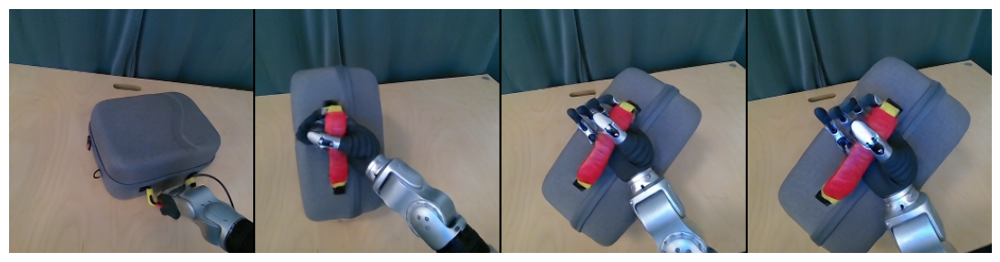

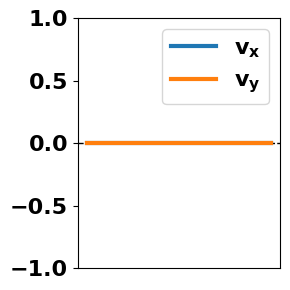

In [7]:
# all_actions_wm = torch.zeros(1, T_ctx + num_pred_steps, 2).to('cuda')  # (1, T_total, n_act)
# all_actions_wm[:, T_ctx:, 0] =  0.  # zero out future actions for worldmodel sampling
# all_actions_wm[:, T_ctx:, 0] =  0.0
# all_actions_wm[:, T_ctx:, :] =  0.0
# all_actions_wm[:, T_ctx:, 0] =  0.0
# all_actions_wm[:, T_ctx:, 1] =  0.0
all_actions_wm = actions.clone()[None].cuda()[:,:T_ctx+num_pred_steps,:]  # (1, T_total, n_act)

# all_actions_wm = torch.from_numpy(pr_act_full)[None].clone()

with torch.autocast(device_type='cuda', dtype=torch.bfloat16):
    pred_obs_wm, _ = unified_flowmatching_sampler(
        denoiser, latents_ctx, mode='wm',
        all_actions=all_actions_wm,
        num_pred_steps=num_pred_steps,
        num_diffusion_steps=num_diffusion_steps,
        context_cond_tau=0.8,
    )
    with torch.no_grad():
        img_pred_wm = tokenizer.decode(pred_obs_wm)

plotVideo(img_pred_wm[0].to(torch.float32))
plotSnapshots(img_pred_wm[0].to(torch.float32), n_frames=4)
plotActions(all_actions_wm[0, T_ctx:T_ctx+num_pred_steps])

## 2. Policy (`policy`)
Given context obs + context actions, jointly predict future observations **and** future actions.

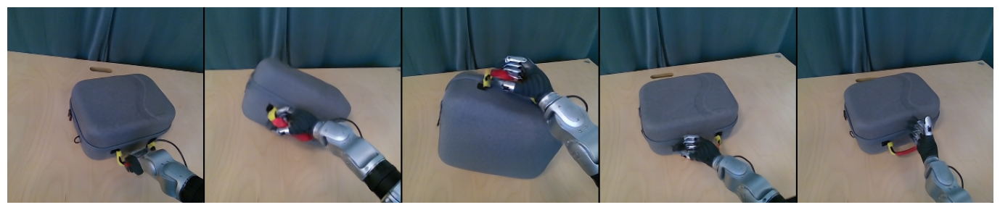

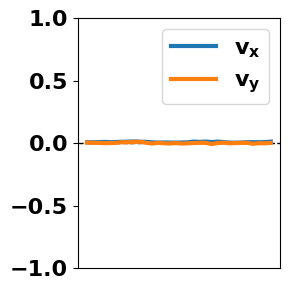

In [8]:
# T_ctx = 4
ctx_actions_policy = actions[:T_ctx][None].cuda()  # (1, T_ctx, n_act)
# ctx_actions_policy+=torch.randn_like(ctx_actions_policy)*0.1  # add noise to context actions for policy sampling

with torch.autocast(device_type='cuda', dtype=torch.bfloat16):
    pred_obs_pol, pred_act_pol = unified_flowmatching_sampler(
        denoiser, latents_ctx, mode='policy',
        ctx_actions=ctx_actions_policy,
        num_pred_steps=num_pred_steps,
        num_diffusion_steps=num_diffusion_steps,
    )
    with torch.no_grad():
        img_pred_pol = tokenizer.decode(pred_obs_pol)

plotVideo(img_pred_pol[0].to(torch.float32))
plotVideo(imgs[0,0:T_ctx].to(torch.float32))
plotSnapshots(img_pred_pol[0].to(torch.float32))
pr_act = pred_act_pol[0].cpu().float().numpy()
plotActions(pr_act)

In [23]:
total_norm = 0.0
max_param = 0.0
max_grad = 0.0

for name, p in denoiser.named_parameters():
    if p.requires_grad:
        # parameter magnitude
        param_abs_max = p.data.abs().max().item()
        max_param = max(max_param, param_abs_max)

        # gradient magnitude
        if p.grad is not None:
            grad_norm = p.grad.data.norm(2).item()
            total_norm += grad_norm ** 2
            max_grad = max(max_grad, p.grad.data.abs().max().item())

total_norm = total_norm ** 0.5
print(f"Grad L2 norm: {total_norm:.3e}, "
      f"Max |grad|: {max_grad:.3e}, "
      f"Max |weight|: {max_param:.3e}")


Grad L2 norm: 0.000e+00, Max |grad|: 0.000e+00, Max |weight|: 1.101e+00


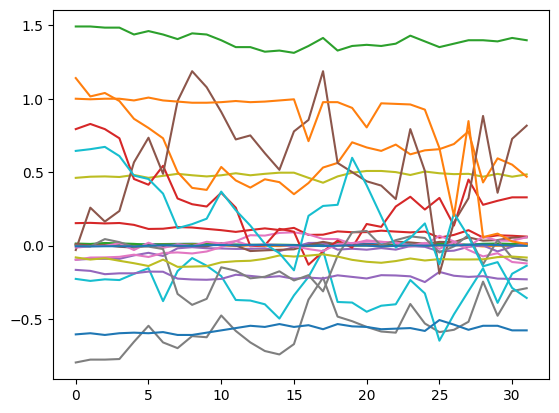

In [9]:
plt.plot(pr_act)

## 2b. Policy with temporally-correlated action noise

Standard `unified_flowmatching_sampler(mode='policy')` draws the per-frame initial action noise `z_act[t] ~ N(0, I)` **i.i.d. across t**. The flow integrator then produces independent action samples per frame, which is the most visible cause of high-frequency jitter in policy-mode rollouts.

**Idea (PYoCo / FreeInit-style temporal noise prior).** Keep the per-frame marginal at `N(0, I)` — the denoiser was trained on that distribution — but make the *joint* across t correlated. The denoiser sees in-distribution noise at every frame, but adjacent frames are seeded from coupled random variables and inherit shared low-frequency structure.

Three constructions (all preserve `N(0, I)` per frame):

- **`ar1`** — `z_t = ρ z_{t-1} + sqrt(1−ρ²) ε_t`. Autocorrelation `ρ^k`. ρ=0 ⇒ i.i.d., ρ→1 ⇒ shared.
- **`lowpass`** — i.i.d. white noise convolved with a Gaussian kernel, then re-normalized per channel.
- **`shared`** — one draw replicated across t (extreme case, mostly a sanity check).

Sampling-time only — no retraining required. References:
- Ge et al., *Preserve Your Own Correlation*, ICCV 2023 (PYoCo) — [arXiv:2305.10474](https://arxiv.org/abs/2305.10474)
- Wu et al., *FreeInit*, ECCV 2024 — [arXiv:2312.07537](https://arxiv.org/abs/2312.07537)
- Chang et al., *How I Warped Your Noise*, ICLR 2024 — [openreview](https://openreview.net/forum?id=pzElnMrgSD)

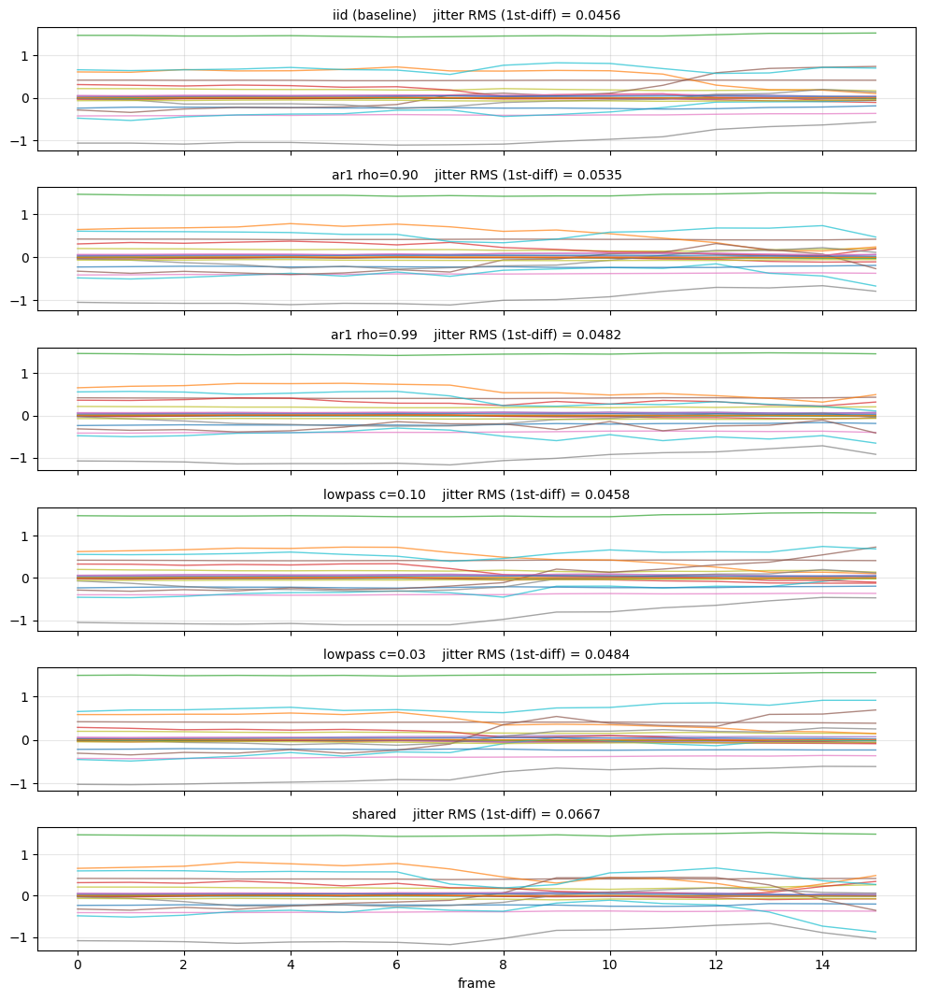


Jitter RMS (first-difference, lower = smoother):
  iid (baseline)      0.04556
  ar1 rho=0.90        0.05350
  ar1 rho=0.99        0.04820
  lowpass c=0.10      0.04576
  lowpass c=0.03      0.04836
  shared              0.06672


In [12]:
import math
import torch
import numpy as np
import matplotlib.pyplot as plt
from dreamerv4uwm.sampling import get_noise_index


def make_correlated_action_noise(B, T_total, n_act, mode='iid', rho=0.95,
                                 cutoff_frac=0.10, device='cuda',
                                 dtype=torch.float32, seed=0):
    """Generate (B, T_total, n_act) noise with per-frame marginal N(0, I)
    and a chosen temporal correlation structure."""
    g = torch.Generator(device=device).manual_seed(seed)
    if mode == 'iid':
        return torch.randn(B, T_total, n_act, device=device, dtype=dtype, generator=g)
    if mode == 'ar1':
        z = torch.empty(B, T_total, n_act, device=device, dtype=dtype)
        z[:, 0] = torch.randn(B, n_act, device=device, dtype=dtype, generator=g)
        s = math.sqrt(max(0.0, 1.0 - rho ** 2))
        for t in range(1, T_total):
            eps = torch.randn(B, n_act, device=device, dtype=dtype, generator=g)
            z[:, t] = rho * z[:, t - 1] + s * eps
        return z
    if mode == 'lowpass':
        sigma = max(1.0 / (2 * math.pi * cutoff_frac), 0.5)
        K = max(3, int(6 * sigma) | 1)
        idx = torch.arange(K, device=device, dtype=dtype) - (K - 1) / 2
        kernel = torch.exp(-(idx ** 2) / (2 * sigma ** 2))
        kernel = kernel / kernel.sum()
        pad = K
        white = torch.randn(B, T_total + 2 * pad, n_act, device=device, dtype=dtype, generator=g)
        white_r = white.permute(0, 2, 1).reshape(B * n_act, 1, -1)
        z_r = torch.nn.functional.conv1d(white_r, kernel.view(1, 1, -1), padding=0)
        z = z_r.view(B, n_act, -1).permute(0, 2, 1)
        z = z[:, pad:pad + T_total].contiguous()
        z = z / z.std(dim=1, keepdim=True).clamp_min(1e-6)
        return z
    if mode == 'shared':
        base = torch.randn(B, 1, n_act, device=device, dtype=dtype, generator=g)
        return base.expand(-1, T_total, -1).contiguous()
    raise ValueError(f'unknown mode: {mode}')


@torch.no_grad()
def policy_sampler_with_action_noise(
    denoiser, ctx_latents, ctx_actions, z_act_init,
    num_pred_steps, num_diffusion_steps,
    context_cond_tau=0.9, action_noise_std=1.0, obs_noise_seed=0,
):
    """Inline reimplementation of unified_flowmatching_sampler(mode='policy') that
    accepts a pre-sampled future-action noise tensor of shape (B, T_total, n_act)."""
    device, dtype = ctx_latents.device, ctx_latents.dtype
    B, T_ctx_, N_lat, D_lat = ctx_latents.shape
    T_total = T_ctx_ + num_pred_steps
    n_act = ctx_actions.shape[-1]
    assert z_act_init.shape == (B, T_total, n_act), (
        f'expected (B,T_total,n_act)=({B},{T_total},{n_act}), got {tuple(z_act_init.shape)}'
    )
    N = denoiser.cfg.denoiser.num_noise_levels
    step_idx_t = torch.zeros((B, T_total), dtype=torch.long, device=device)
    tau_cond_idx = get_noise_index(context_cond_tau, N)
    stride = N // num_diffusion_steps
    step_size = 1.0 / num_diffusion_steps

    g_obs = torch.Generator(device=device).manual_seed(obs_noise_seed)
    z = torch.randn(B, T_total, N_lat, D_lat, device=device, dtype=dtype, generator=g_obs)
    z[:, :T_ctx_] = ((1.0 - context_cond_tau) * torch.randn_like(ctx_latents) +
                     context_cond_tau * ctx_latents)

    z_act = (action_noise_std * z_act_init.to(device=device, dtype=dtype)).clone()
    z_act[:, :T_ctx_] = ((1.0 - context_cond_tau) * action_noise_std *
                         torch.randn_like(ctx_actions).to(device=device, dtype=dtype)
                         + context_cond_tau * ctx_actions.to(device=device, dtype=dtype))

    for k in range(num_diffusion_steps):
        tau_idx_now = k * stride
        tau_now = tau_idx_now / float(N)
        sigma_idx = torch.full((B, T_total), tau_idx_now, dtype=torch.long, device=device)
        sigma_idx[:, :T_ctx_] = tau_cond_idx
        z_hat, act_hat, _ = denoiser(
            noisy_act=z_act, noisy_obs=z,
            obs_sigma_idx=sigma_idx, obs_step_idx=step_idx_t,
            act_sigma_idx=sigma_idx, act_step_idx=step_idx_t,
        )
        act_hat = act_hat.squeeze(-2)
        denom = max(1.0 - tau_now, 1e-5)
        z[:, T_ctx_:] = z[:, T_ctx_:] + ((z_hat - z) / denom * step_size)[:, T_ctx_:]
        z_act[:, T_ctx_:] = z_act[:, T_ctx_:] + ((act_hat - z_act) / denom * step_size)[:, T_ctx_:]
    return z[:, T_ctx_:], z_act[:, T_ctx_:]


# ---- run comparison ----
B = ctx_actions_policy.shape[0]
T_total = T_ctx + num_pred_steps
n_act_dim = ctx_actions_policy.shape[-1]

variants = [
    ('iid (baseline)',  dict(mode='iid')),
    ('ar1 rho=0.90',    dict(mode='ar1', rho=0.90)),
    ('ar1 rho=0.99',    dict(mode='ar1', rho=0.99)),
    ('lowpass c=0.10',  dict(mode='lowpass', cutoff_frac=0.10)),
    ('lowpass c=0.03',  dict(mode='lowpass', cutoff_frac=0.03)),
    ('shared',          dict(mode='shared')),
]

SEED = 7
results = {}
for label, kw in variants:
    z_init = make_correlated_action_noise(
        B, T_total, n_act_dim, device=latents_ctx.device, dtype=torch.float32,
        seed=SEED, **kw,
    )
    with torch.autocast(device_type='cuda', dtype=torch.bfloat16):
        _, pred_act_cn = policy_sampler_with_action_noise(
            denoiser, latents_ctx, ctx_actions_policy,
            z_act_init=z_init,
            num_pred_steps=num_pred_steps,
            num_diffusion_steps=num_diffusion_steps,
            obs_noise_seed=SEED,
        )
    pa = pred_act_cn[0].cpu().float().numpy()
    jitter = float(np.sqrt((np.diff(pa, axis=0) ** 2).mean()))
    results[label] = (pa, jitter)

# plot
fig, axes = plt.subplots(len(results), 1, figsize=(10, 1.8 * len(results)), sharex=True)
if len(results) == 1:
    axes = [axes]
for ax, (lbl, (pa, j)) in zip(axes, results.items()):
    for d in range(pa.shape[1]):
        ax.plot(pa[:, d], lw=1.0, alpha=0.7)
    ax.set_title(f'{lbl}    jitter RMS (1st-diff) = {j:.4f}', fontsize=10)
    ax.grid(alpha=0.3)
axes[-1].set_xlabel('frame')
plt.tight_layout()
plt.show()

print('\nJitter RMS (first-difference, lower = smoother):')
for lbl, (_, j) in results.items():
    print(f'  {lbl:18s}  {j:.5f}')

In [51]:
from dreamerv4uwm.sampling import get_noise_index

@torch.no_grad()
def progressive_rolling_sampler(
    denoiser,
    init_latents,           # (B, T_init, N_lat, D_lat) — clean obs context
    init_actions,           # (B, T_init, n_act)        — clean action context
    total_pred_steps,       # frames to emit
    window_size=8,          # F: rolling window size = #steps to fully clean one frame
    context_size=8,         # C: clean prefix kept in front of the window (0 = pure paper algo)
    context_cond_tau=1.0,
    action_noise_std=1.0,
):
    """Progressive autoregressive rolling sampler.

    Adapts 'Progressive Autoregressive Video Diffusion Models' (Xie et al., 2024,
    https://arxiv.org/abs/2410.08151) to the UWM joint obs+action flowmatching
    denoiser. Each main-loop iteration:
        1. All F window frames are denoised by one quantum (dt = 1/F).
        2. The frontmost frame reaches tau=1 (clean) and is emitted.
        3. The window shifts left; a fresh pure-noise frame is appended at the back.
        4. The clean prefix (length C) gains the emitted frame and drops its oldest.

    A short F-1 step warmup grows the window from 1 to F so the staircase noise
    schedule is built in place rather than faked from samples.

    Note: this codebase uses tau=1 == clean, tau=0 == pure noise (opposite of the
    paper). The staircase is expressed in this convention throughout.
    """
    F, C = window_size, context_size
    device = init_latents.device
    dtype  = init_latents.dtype
    B, T_init, N_lat, D_lat = init_latents.shape
    n_act = init_actions.shape[-1]
    init_actions = init_actions.to(device=device, dtype=dtype)

    assert C <= T_init, f"context_size C={C} cannot exceed init context T_init={T_init}"
    N = denoiser.cfg.denoiser.num_noise_levels
    assert N % F == 0, "num_noise_levels must be divisible by window_size for an exact stride"

    stride       = N // F          # quanta advanced per Euler step
    step_size    = 1.0 / F         # Euler dt
    tau_cond_idx = get_noise_index(context_cond_tau, N)

    # always-clean prefix (re-noised to tau_cond on every forward)
    prefix_obs = init_latents[:, -C:].clone() if C > 0 else None
    prefix_act = init_actions[:, -C:].clone() if C > 0 else None

    # rolling window starts with a single pure-noise frame; warmup grows it to F.
    z_obs   = torch.randn(B, 1, N_lat, D_lat, device=device, dtype=dtype)
    z_act   = action_noise_std * torch.randn(B, 1, n_act, device=device, dtype=dtype)
    tau_idx = torch.zeros((B, 1), dtype=torch.long, device=device)

    def _fresh_noise():
        return (
            torch.randn(B, 1, N_lat, D_lat, device=device, dtype=dtype),
            action_noise_std * torch.randn(B, 1, n_act, device=device, dtype=dtype),
            torch.zeros((B, 1), dtype=torch.long, device=device),
        )

    pred_obs_buf, pred_act_buf = [], []

    while len(pred_obs_buf) < total_pred_steps:
        cur_F = z_obs.shape[1]

        # ---- assemble input: noised clean prefix + window ----
        if C > 0:
            p_obs_in = (1.0 - context_cond_tau) * torch.randn_like(prefix_obs) + context_cond_tau * prefix_obs
            p_act_in = ((1.0 - context_cond_tau) * action_noise_std * torch.randn_like(prefix_act)
                        + context_cond_tau * prefix_act)
            obs_in = torch.cat([p_obs_in, z_obs], dim=1)
            act_in = torch.cat([p_act_in, z_act], dim=1)
            prefix_sigma = torch.full((B, C), tau_cond_idx, dtype=torch.long, device=device)
            sigma_idx = torch.cat([prefix_sigma, tau_idx], dim=1)
        else:
            obs_in, act_in, sigma_idx = z_obs, z_act, tau_idx

        step_idx_tensor = torch.zeros((B, C + cur_F), dtype=torch.long, device=device)

        z_hat, act_hat, _ = denoiser(
            noisy_act    = act_in,
            noisy_obs    = obs_in,
            obs_sigma_idx= sigma_idx,
            obs_step_idx = step_idx_tensor,
            act_sigma_idx= sigma_idx,
            act_step_idx = step_idx_tensor,
        )
        act_hat = act_hat.squeeze(-2)
        z_hat_w, act_hat_w = z_hat[:, C:], act_hat[:, C:]

        # ---- per-frame Euler step on the window ----
        tau_cont = tau_idx.float() / float(N)              # (B, cur_F)
        denom    = (1.0 - tau_cont).clamp_min(1e-5)         # (B, cur_F)
        z_obs = z_obs + (z_hat_w   - z_obs) / denom[..., None, None] * step_size
        z_act = z_act + (act_hat_w - z_act) / denom[..., None]       * step_size
        tau_idx = tau_idx + stride

        if cur_F < F:
            # warmup: append a fresh noise frame at the back, no emission
            new_o, new_a, new_t = _fresh_noise()
            z_obs   = torch.cat([z_obs,   new_o], dim=1)
            z_act   = torch.cat([z_act,   new_a], dim=1)
            tau_idx = torch.cat([tau_idx, new_t], dim=1)
        else:
            # main: emit front, shift left, append fresh noise at back
            emit_obs, emit_act = z_obs[:, :1], z_act[:, :1]
            pred_obs_buf.append(emit_obs)
            pred_act_buf.append(emit_act)

            new_o, new_a, new_t = _fresh_noise()
            z_obs   = torch.cat([z_obs[:, 1:],   new_o], dim=1)
            z_act   = torch.cat([z_act[:, 1:],   new_a], dim=1)
            tau_idx = torch.cat([tau_idx[:, 1:], new_t], dim=1)

            if C > 0:
                prefix_obs = torch.cat([prefix_obs[:, 1:], emit_obs], dim=1)
                prefix_act = torch.cat([prefix_act[:, 1:], emit_act], dim=1)

    return torch.cat(pred_obs_buf, dim=1), torch.cat(pred_act_buf, dim=1)

In [52]:
actions.shape

torch.Size([128, 22])

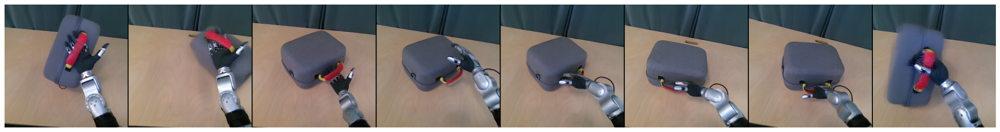

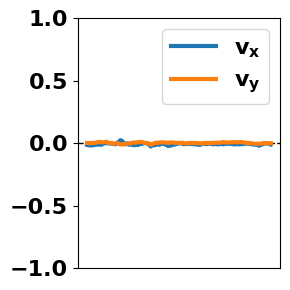

In [58]:
# Progressive autoregressive rollout: per-frame staircase noise schedule.
total_pred_steps = 128      # frames to emit
window_size      = 2       # F: per-frame staircase depth (= #steps to clean one frame)
context_size     = 16       # C: clean overlap-conditioning prefix

# init_latents = latents[:, :context_size, ...].clone()
# init_actions = actions[:context_size][None].cuda()

init_latents = latents[:, 0, ...].clone().unsqueeze(1).repeat(1, context_size, 1, 1)
init_actions = actions[0].clone().unsqueeze(0).repeat(context_size,1).cuda()[None]



with torch.autocast(device_type='cuda', dtype=torch.bfloat16):
    prog_obs, prog_act = progressive_rolling_sampler(
        denoiser,
        init_latents     = init_latents,
        init_actions     = init_actions,
        total_pred_steps = total_pred_steps,
        window_size      = window_size,
        context_size     = context_size,
    )
    with torch.no_grad():
        prog_imgs = tokenizer.decode(prog_obs)

plotVideo(prog_imgs[0].to(torch.float32))
plotSnapshots(prog_imgs[0].to(torch.float32), n_frames=8)
plotActions(prog_act[0].cpu().float().numpy())

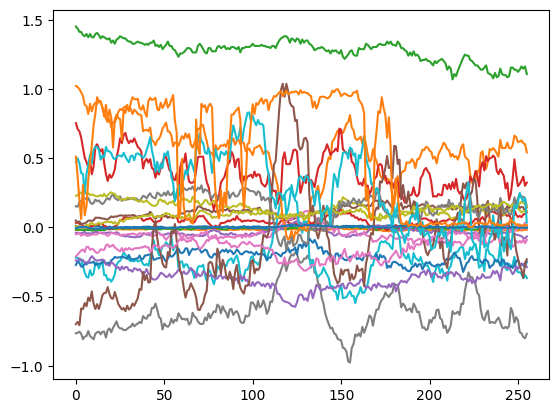

In [47]:
plt.plot(prog_act[0].cpu().float().numpy())

## 3. Video Prediction (`video`)
Given context obs only (no action signal at all), predict future observations. Actions are pure noise throughout — the model must predict the future from visual context alone.

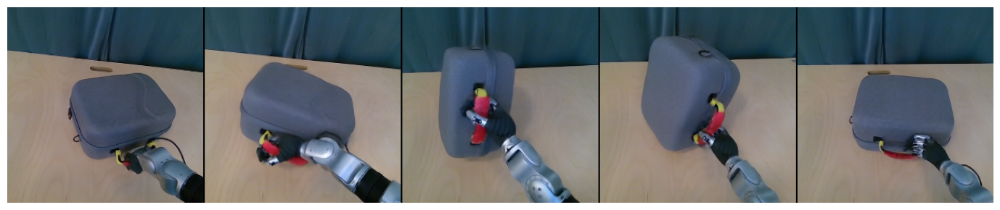

In [10]:
with torch.autocast(device_type='cuda', dtype=torch.bfloat16):
    pred_obs_vid, _ = unified_flowmatching_sampler(
        denoiser, latents_ctx, mode='video',
        ctx_actions=ctx_actions_policy,  # only used to infer n_act dimension
        num_pred_steps=num_pred_steps,
        num_diffusion_steps=num_diffusion_steps,
    )
    with torch.no_grad():
        img_pred_vid = tokenizer.decode(pred_obs_vid)

plotVideo(img_pred_vid[0].to(torch.float32))
plotSnapshots(img_pred_vid[0].to(torch.float32))

## 4. Inverse Dynamics (`id`)
Given **all** observations (context + future, clean), predict actions for all frames. The model infers what actions produced the observed state transitions.

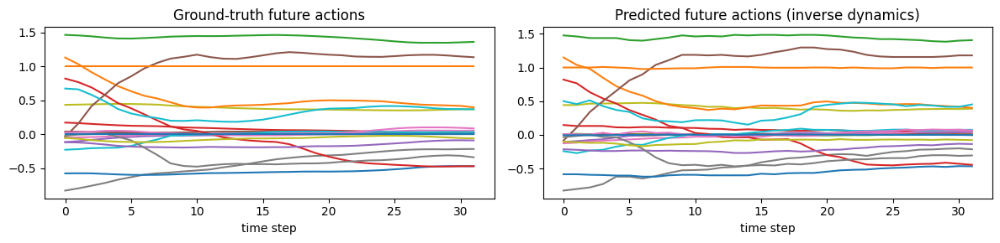

In [11]:
all_latents_id = latents[:, :T_ctx + num_pred_steps, ...]  # (1, T_total, N_lat, D_lat)

with torch.autocast(device_type='cuda', dtype=torch.bfloat16):
    _, pred_act_id = unified_flowmatching_sampler(
        denoiser, latents_ctx, mode='id',
        ctx_actions=ctx_actions_policy,  # used to infer n_act
        all_latents=all_latents_id,
        num_pred_steps=num_pred_steps,
        num_diffusion_steps=num_diffusion_steps,
    )

# Plot predicted vs ground-truth actions (future portion only)
fig, axes = plt.subplots(1, 2, figsize=(12, 3))
gt_act = actions[T_ctx:T_ctx + num_pred_steps].cpu().float().numpy()
pr_act = pred_act_id[0].cpu().float().numpy()
axes[0].set_title("Ground-truth future actions")
axes[0].plot(gt_act)
axes[1].set_title("Predicted future actions (inverse dynamics)")
axes[1].plot(pr_act)
for ax in axes:
    ax.set_xlabel("time step")
plt.tight_layout()
plt.show()

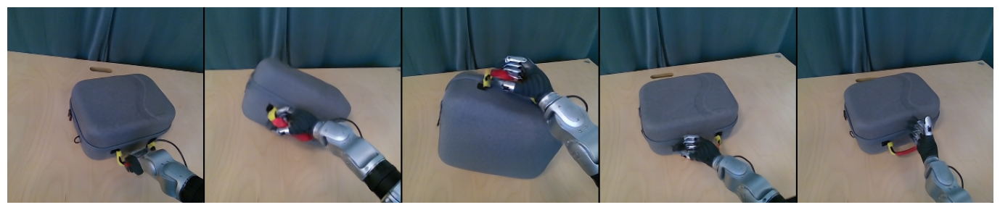

In [12]:
plotSnapshots(img_pred_pol[0].to(torch.float32))

# Autoregressive Sampling — `AutoRegressiveForwardDynamics`

KV-cached, frame-by-frame rollout for the **flow-matching** UWM denoiser. The class wraps the denoiser and tokenizer together with their decoder caches and supports two modes:

- **`wm`** — world model. The caller passes the next action at every `step()`; the action is treated as clean and only the next observation is denoised.
- **`policy`** — `step()` takes no input; the next observation and the next action are denoised jointly. Context actions are slightly noised at `tau_cond` to match policy training.

Both modes prime the cache via `reset(imgs_init, actions_init)` and then advance one frame per `step()`.


In [41]:
from dreamerv4uwm.sampling import AutoRegressiveForwardDynamics
episode_length = 128
demo_end_index = 3
num_pred_steps = episode_length - demo_end_index
T_ctx = demo_end_index

denoising_step_count = 8        # power of two; flow-matching Euler steps per frame
context_cond_tau = 0.99
# max_forward_steps = T_ctx + num_pred_steps + 4   # safety margin for KV cache size
max_forward_steps = 32   # safety margin for KV cache size

imgs_ctx = imgs[:, :T_ctx]                      # (1, T_ctx, C, H, W)
actions_ctx = actions[:T_ctx][None].to(device)  # (1, T_ctx, n_act)

N_batch = 1
imgs_ctx = imgs_ctx.expand(N_batch, -1, -1, -1, -1)
actions_ctx = actions_ctx.expand(N_batch, -1, -1)

## 1. World-model rollout (`mode='wm'`)
We supply the next action at every step — actions are treated as clean and only the next obs is denoised. We feed the ground-truth future actions for the visualisation.


In [52]:
from hydra import initialize, compose
from omegaconf import OmegaConf
with initialize(version_base=None, config_path="../scripts/config"):
    cfg = compose(config_name="dynamics/g1-large.yaml")

/home/mim-server/miniconda3/envs/dreamerv4/lib/python3.11/site-packages/hydra/_internal/defaults_list.py:251: UserWarning: In 'dynamics/g1-large.yaml': Defaults list is missing `_self_`. See https://hydra.cc/docs/1.2/upgrades/1.0_to_1.1/default_composition_order for more information
  warnings.warn(msg, UserWarning)


In [53]:
dynamics_ckpt = "/home/mim-server/projects/rooholla/dreamerV4-UWM/checkpoints/dynamics/G1/86504.pt"
tokenizer_ckpt="/home/mim-server/projects/rooholla/dreamerV4-UWM/checkpoints/tokenizer/g1_reference.pt"
cfg.dynamics_ckpt = dynamics_ckpt
cfg.tokenizer_ckpt=tokenizer_ckpt
denoiser = load_denoiser(cfg, device, max_num_forward_steps=300)
tokenizer = load_tokenizer(cfg, device, max_num_forward_steps=300)
tokenizer = tokenizer.eval().cuda()
denoiser = denoiser.eval().cuda()

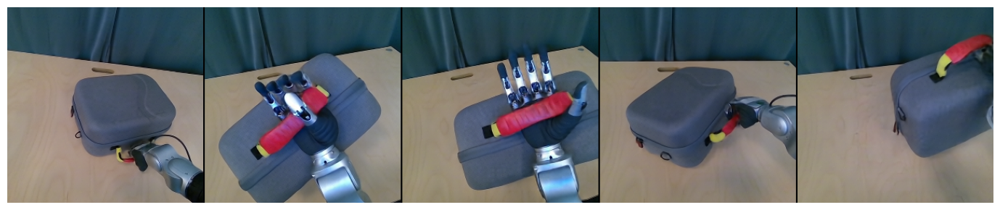

In [59]:
ar_wm = AutoRegressiveForwardDynamics(
    denoiser=denoiser,
    tokenizer=tokenizer,
    mode='wm',
    context_length=64,
    max_forward_steps=max_forward_steps,
    context_cond_tau=context_cond_tau,
    denoising_step_count=denoising_step_count,
    device=device,
    dtype=torch.float32,
)

future_actions_wm = actions.clone()[None, T_ctx:T_ctx + num_pred_steps, :].to(device)  # (1, num_pred_steps, n_act)

frames_wm = []
with torch.autocast(device_type='cuda', dtype=torch.bfloat16):
    ar_wm.reset(imgs_ctx, actions_ctx)
    for t in range(num_pred_steps):
        img_t = ar_wm.step(actions_t=future_actions_wm[:, t])
        frames_wm.append(img_t.detach().cpu())

video_wm = torch.stack(frames_wm, dim=1)[0]      # (num_pred_steps, C, H, W)
plotVideo(video_wm.to(torch.float32))
plotSnapshots(video_wm.to(torch.float32), n_frames=5)

In [51]:
denoiser.model

DreamerV4Denoiser(
  (obs_diffusion_embedder): DiscreteEmbedder()
  (obs_shortcut_embedder): DiscreteEmbedder()
  (act_diffusion_embedder): DiscreteEmbedder()
  (act_shortcut_embedder): DiscreteEmbedder()
  (layers): ModuleList(
    (0-5): 6 x EfficientTransformerBlock(
      (layers): ModuleList(
        (0-3): 4 x EfficientTransformerLayer(
          (rope): RopeEmbedding()
          (attn): AxialAttention(
            (attn): Attention(
              (rope_embedder): RopeEmbedding()
              (W_q): Linear(in_features=1536, out_features=1536, bias=False)
              (W_k): Linear(in_features=1536, out_features=1536, bias=False)
              (W_v): Linear(in_features=1536, out_features=1536, bias=False)
              (W_o): Linear(in_features=1536, out_features=1536, bias=False)
            )
          )
          (norm1): RMSNorm((1536,), eps=None, elementwise_affine=True)
          (norm2): RMSNorm((1536,), eps=None, elementwise_affine=True)
          (ffn): FeedForwardSwiGL

## 2. Policy rollout (`mode='policy'`)
No actions are fed during rollout — the policy denoises the next obs and the next action jointly at each step.


In [20]:
ar_pol = AutoRegressiveForwardDynamics(
    denoiser=denoiser,
    tokenizer=tokenizer,
    mode='policy',
    context_length=max_forward_steps,
    max_forward_steps=max_forward_steps,
    context_cond_tau=context_cond_tau,
    denoising_step_count=denoising_step_count,
    device=device,
    dtype=torch.float32,
)



In [21]:
frames_pol, acts_pol = [], []
with torch.no_grad():
    with torch.autocast(device_type='cuda', dtype=torch.bfloat16):
        ar_pol.reset(imgs_ctx, actions_ctx)
        for t in range(num_pred_steps):
            img_t, act_t = ar_pol.step()
            frames_pol.append(img_t.detach().cpu())
            acts_pol.append(act_t.detach().cpu())

In [22]:
video_pol = torch.stack(frames_pol, dim=1)
acts_pol_seq = torch.stack(acts_pol, dim=1)

video_all = torch.concat([imgs[:, :T_ctx].cpu().expand(video_pol.shape[0], -1, -1, -1, -1), video_pol.cpu()], dim=1)  # (1, 3, T, C, H, W)
# actions_all = torch.concat([actions[:T_ctx].cpu(), acts_pol_seq.cpu()], dim=0)  # (1, T, n_act)
for k in range(video_all.shape[0]):
    plotVideo(video_all.to(torch.float32)[k])

# plotSnapshots(video_all.to(torch.float32), n_frames=5)
# plotActions(acts_pol_seq.to(torch.float32))

In [25]:
import torch
from dreamerv4uwm.sampling import get_noise_index

@torch.no_grad()
def progressive_rolling_sampler(
    denoiser,
    init_latents,           # (B, T_init, N_lat, D_lat) — clean obs context
    init_actions,           # (B, T_init, n_act)        — clean action context
    total_pred_steps,       # frames to emit
    window_size=8,          # F: rolling window size = #steps to fully clean one frame
    context_size=8,         # C: clean prefix kept in front of the window (0 = pure paper algo)
    context_cond_tau=0.9,
    action_noise_std=1.0,
):
    """Progressive autoregressive rolling sampler.

    Adapts 'Progressive Autoregressive Video Diffusion Models' (Xie et al., 2024,
    https://arxiv.org/abs/2410.08151) to the UWM joint obs+action flowmatching
    denoiser. Each main-loop iteration:
        1. All F window frames are denoised by one quantum (dt = 1/F).
        2. The frontmost frame reaches tau=1 (clean) and is emitted.
        3. The window shifts left; a fresh pure-noise frame is appended at the back.
        4. The clean prefix (length C) gains the emitted frame and drops its oldest.

    A short F-1 step warmup grows the window from 1 to F so the staircase noise
    schedule is built in place rather than faked from samples.

    Note: this codebase uses tau=1 == clean, tau=0 == pure noise (opposite of the
    paper). The staircase is expressed in this convention throughout.
    """
    F, C = window_size, context_size
    device = init_latents.device
    dtype  = init_latents.dtype
    B, T_init, N_lat, D_lat = init_latents.shape
    n_act = init_actions.shape[-1]
    init_actions = init_actions.to(device=device, dtype=dtype)

    assert C <= T_init, f"context_size C={C} cannot exceed init context T_init={T_init}"
    N = denoiser.cfg.denoiser.num_noise_levels
    assert N % F == 0, "num_noise_levels must be divisible by window_size for an exact stride"

    stride       = N // F          # quanta advanced per Euler step
    step_size    = 1.0 / F         # Euler dt
    tau_cond_idx = get_noise_index(context_cond_tau, N)

    # always-clean prefix (re-noised to tau_cond on every forward)
    prefix_obs = init_latents[:, -C:].clone() if C > 0 else None
    prefix_act = init_actions[:, -C:].clone() if C > 0 else None

    # rolling window starts with a single pure-noise frame; warmup grows it to F.
    z_obs   = torch.randn(B, 1, N_lat, D_lat, device=device, dtype=dtype)
    z_act   = action_noise_std * torch.randn(B, 1, n_act, device=device, dtype=dtype)
    tau_idx = torch.zeros((B, 1), dtype=torch.long, device=device)

    def _fresh_noise():
        return (
            torch.randn(B, 1, N_lat, D_lat, device=device, dtype=dtype),
            action_noise_std * torch.randn(B, 1, n_act, device=device, dtype=dtype),
            torch.zeros((B, 1), dtype=torch.long, device=device),
        )

    pred_obs_buf, pred_act_buf = [], []

    while len(pred_obs_buf) < total_pred_steps:
        cur_F = z_obs.shape[1]

        # ---- assemble input: noised clean prefix + window ----
        if C > 0:
            p_obs_in = (1.0 - context_cond_tau) * torch.randn_like(prefix_obs) + context_cond_tau * prefix_obs
            p_act_in = ((1.0 - context_cond_tau) * action_noise_std * torch.randn_like(prefix_act)
                        + context_cond_tau * prefix_act)
            obs_in = torch.cat([p_obs_in, z_obs], dim=1)
            act_in = torch.cat([p_act_in, z_act], dim=1)
            prefix_sigma = torch.full((B, C), tau_cond_idx, dtype=torch.long, device=device)
            sigma_idx = torch.cat([prefix_sigma, tau_idx], dim=1)
        else:
            obs_in, act_in, sigma_idx = z_obs, z_act, tau_idx

        step_idx_tensor = torch.zeros((B, C + cur_F), dtype=torch.long, device=device)

        z_hat, act_hat, _ = denoiser(
            noisy_act    = act_in,
            noisy_obs    = obs_in,
            obs_sigma_idx= sigma_idx,
            obs_step_idx = step_idx_tensor,
            act_sigma_idx= sigma_idx,
            act_step_idx = step_idx_tensor,
        )
        act_hat = act_hat.squeeze(-2)
        z_hat_w, act_hat_w = z_hat[:, C:], act_hat[:, C:]

        # ---- per-frame Euler step on the window ----
        tau_cont = tau_idx.float() / float(N)              # (B, cur_F)
        denom    = (1.0 - tau_cont).clamp_min(1e-5)         # (B, cur_F)
        z_obs = z_obs + (z_hat_w   - z_obs) / denom[..., None, None] * step_size
        z_act = z_act + (act_hat_w - z_act) / denom[..., None]       * step_size
        tau_idx = tau_idx + stride

        if cur_F < F:
            # warmup: append a fresh noise frame at the back, no emission
            new_o, new_a, new_t = _fresh_noise()
            z_obs   = torch.cat([z_obs,   new_o], dim=1)
            z_act   = torch.cat([z_act,   new_a], dim=1)
            tau_idx = torch.cat([tau_idx, new_t], dim=1)
        else:
            # main: emit front, shift left, append fresh noise at back
            emit_obs, emit_act = z_obs[:, :1], z_act[:, :1]
            pred_obs_buf.append(emit_obs)
            pred_act_buf.append(emit_act)

            new_o, new_a, new_t = _fresh_noise()
            z_obs   = torch.cat([z_obs[:, 1:],   new_o], dim=1)
            z_act   = torch.cat([z_act[:, 1:],   new_a], dim=1)
            tau_idx = torch.cat([tau_idx[:, 1:], new_t], dim=1)

            if C > 0:
                prefix_obs = torch.cat([prefix_obs[:, 1:], emit_obs], dim=1)
                prefix_act = torch.cat([prefix_act[:, 1:], emit_act], dim=1)

    return torch.cat(pred_obs_buf, dim=1), torch.cat(pred_act_buf, dim=1)

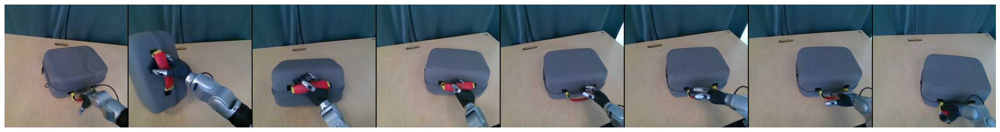

In [35]:
# Progressive autoregressive rollout: per-frame staircase noise schedule.
total_pred_steps = 128      # frames to emit
window_size      = 4       # F: per-frame staircase depth (= #steps to clean one frame)
context_size     = 4       # C: clean overlap-conditioning prefix

init_latents = latents[:, 0, ...].clone().unsqueeze(1).repeat(1, context_size, 1, 1)
init_actions = actions[0].clone().unsqueeze(0).repeat(context_size,1).cuda()[None]


with torch.autocast(device_type='cuda', dtype=torch.bfloat16):
    prog_obs, prog_act = progressive_rolling_sampler(
        denoiser,
        init_latents     = init_latents,
        init_actions     = init_actions,
        total_pred_steps = total_pred_steps,
        window_size      = window_size,
        context_size     = context_size,
    )
    with torch.no_grad():
        prog_imgs = tokenizer.decode(prog_obs)

plotVideo(prog_imgs[0].to(torch.float32))
plotSnapshots(prog_imgs[0].to(torch.float32), n_frames=8)

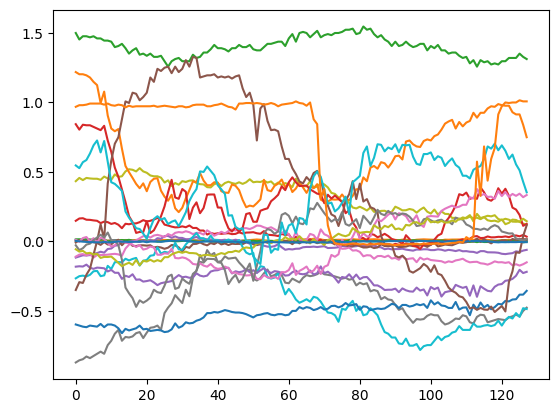

In [36]:
_ = plt.plot(prog_act[0].cpu().float().numpy())